# Analysis of OSM-GeoDanmark differences between municipalities

In [30]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pickle
import json
import pandas as pd
import seaborn as sns
import plotly.express as px
import numpy as np
from scipy import stats

%run ../settings/yaml_variables.py
%run ../settings/paths.py

In [31]:
make_plots = True

## Differences per municipality

In [32]:
# Load results of municipal analysis
osm_muni = pd.read_csv(
    osm_analysis_data_fp + "muni_network_counts.csv", index_col=False
)
ref_muni = pd.read_csv(
    ref_analysis_data_fp + "muni_network_counts.csv", index_col=False
)


osm_muni['datasource'] = 'osm'
ref_muni['datasource'] = 'ref'

combined = pd.concat([osm_muni.reset_index(), ref_muni.reset_index()])
combined.drop('index',axis=1, inplace=True)

osm_muni.set_index('navn',inplace=True)
ref_muni.set_index('navn',inplace=True)

osm_muni.fillna(0,inplace=True)
ref_muni.fillna(0,inplace=True)

### Compute total differences between OSM & GeoDanmark data

In [33]:
diffs = []

diff_cols = ['node_count', 'dangling_node_count',
       'infra_km', 'infra_dens', 'infra_pop', 'overshoots',
       'undershoots', 'component_gaps', 'component_count',
       'comp_per_km']

for c in diff_cols:
    diff = ref_muni[c] - osm_muni[c]
    diffs.append(diff)

diff_df = pd.DataFrame(diffs).transpose()
diff_df

,node_count,dangling_node_count,infra_km,infra_dens,infra_pop,overshoots,undershoots,component_gaps,component_count,comp_per_km
navn,,,,,,,,,,
Aabenraa,146.0,-630.0,-141.827,-0.151,-2.403766,-2.0,6.0,23.0,-181.0,-0.43
Aalborg,-2243.0,-1539.0,-454.272,-0.399,-2.041021,-2.0,4.0,24.0,-343.0,-0.19
Aarhus,-3146.0,-1701.0,-696.639,-1.478,-1.926844,-4.0,20.0,170.0,-172.0,0.66
Albertslund,-423.0,-134.0,-101.097,-4.313,-3.672248,-1.0,-1.0,-7.0,0.0,2.76
Allerød,-853.0,-443.0,-103.364,-1.533,-3.966233,-1.0,-1.0,9.0,-56.0,0.00
...,...,...,...,...,...,...,...,...,...,...
Vejle,-1343.0,-1047.0,-254.993,-0.240,-2.108269,0.0,20.0,65.0,-200.0,-0.20
Vesthimmerlands,-533.0,-328.0,-264.022,-0.344,-7.247180,0.0,0.0,15.0,-69.0,0.32
Viborg,-1085.0,-875.0,-58.637,-0.041,-0.599984,-4.0,4.0,109.0,-176.0,-0.35


In [34]:
combined

,infrastructure_length,node_count,dangling_node_count,infra_km,navn,area_sqkm,infra_dens,pop,infra_pop,overshoots,undershoots,over_under,component_gaps,component_count,comp_per_km,datasource
0,335369.036516,1244,756,335.369,Aabenraa,940.61,0.357,59002,5.684028,2.0,NaN,0.0,9,232,0.69,osm
1,673036.627489,3721,1845,673.037,Aalborg,1138.00,0.591,222571,3.023920,2.0,8.0,10.0,42,445,0.66,osm
2,937194.677683,5243,2391,937.195,Aarhus,471.20,1.989,361544,2.592202,7.0,12.0,19.0,87,443,0.47,osm
3,110990.891005,509,196,110.991,Albertslund,23.44,4.735,27530,4.031638,2.0,1.0,3.0,8,30,0.27,osm
4,157756.329035,1150,512,157.756,Allerød,67.43,2.340,26061,6.053336,2.0,5.0,7.0,23,86,0.55,osm
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,203558.475958,1002,219,203.558,Vejle,1061.61,0.192,120949,1.683007,1.0,21.0,22.0,90,86,0.42,ref
94,41079.393930,221,62,41.079,Vesthimmerlands,768.04,0.053,36431,1.127584,NaN,NaN,0.0,24,26,0.63,ref
95,401855.089934,1199,256,401.855,Viborg,1421.26,0.283,97731,4.111848,1.0,4.0,5.0,127,112,0.28,ref
96,75289.385711,363,109,75.289,Vordingborg,625.26,0.120,45441,1.656852,NaN,6.0,0.0,73,54,0.72,ref


### Compute percent differences between OSM & GeoDanmark data

In [35]:
topology_cols = ['overshoots','undershoots','over_under','component_gaps']
pct_diff_cols = [d for d in diff_cols if d not in topology_cols]

pct_diffs = []
for d in pct_diff_cols:
    pct_diff = np.round(
        100
        * (ref_muni[d] - osm_muni[d])
        / osm_muni[d],
        2,
    )
    pct_diffs.append(pct_diff)

pct_diff_df = pd.DataFrame(pct_diffs).transpose()
pct_diff_df

,node_count,dangling_node_count,infra_km,infra_dens,infra_pop,component_count,comp_per_km
navn,,,,,,,
Aabenraa,11.74,-83.33,-42.29,-42.30,-42.29,-78.02,-62.32
Aalborg,-60.28,-83.41,-67.50,-67.51,-67.50,-77.08,-28.79
Aarhus,-60.00,-71.14,-74.33,-74.31,-74.33,-38.83,140.43
Albertslund,-83.10,-68.37,-91.09,-91.09,-91.09,0.00,1022.22
Allerød,-74.17,-86.52,-65.52,-65.51,-65.52,-65.12,0.00
...,...,...,...,...,...,...,...
Vejle,-57.27,-82.70,-55.61,-55.56,-55.61,-69.93,-32.26
Vesthimmerlands,-70.69,-84.10,-86.54,-86.65,-86.54,-72.63,103.23
Viborg,-47.50,-77.37,-12.73,-12.65,-12.73,-61.11,-55.56


In [36]:
pct_diff_df.describe()

,node_count,dangling_node_count,infra_km,infra_dens,infra_pop,component_count,comp_per_km
count,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,-29.795000,-70.956429,-56.310816,-56.304796,-56.310816,-44.397347,93.039286
std,55.059892,17.282670,26.496092,26.518745,26.496092,56.794160,331.868873
min,-84.920000,-95.160000,-94.180000,-94.180000,-94.180000,-85.440000,-77.030000
25%,-60.120000,-82.165000,-73.452500,-73.552500,-73.452500,-70.260000,-30.635000
50%,-46.820000,-74.500000,-62.330000,-62.350000,-62.330000,-57.090000,20.920000
75%,-23.815000,-66.177500,-46.887500,-46.980000,-46.887500,-40.032500,73.675000
max,338.640000,16.130000,80.400000,80.820000,80.400000,420.000000,2857.140000


#### Completeness

In [37]:
count_osm_bigger = len(diff_df[diff_df.infra_km < 0])
osm_bigger = list(diff_df[diff_df.infra_km < 0].index.values)
count_ref_bigger = len(diff_df[diff_df.infra_km > 0])
ref_bigger = list(diff_df[diff_df.infra_km > 0].index.values)

print(f"Out of {len(diff_df)} municipalities, the length of the OSM network is smaller in {count_ref_bigger} and larger in {count_osm_bigger} municipalities.")

min_diff = diff_df.infra_km.abs().min()
max_diff = diff_df.infra_km.abs().max()
min_pct_diff = pct_diff_df.infra_km.abs().min()
max_pct_diff = pct_diff_df.infra_km.abs().max()

ave_abs_diff = diff_df.infra_km.abs().mean()
ave_pct_diff = pct_diff_df.infra_km.abs().mean()

print(f"The difference ranges between {min_diff:.2f} and {max_diff:.2f} km or {min_pct_diff:.2f} - {max_pct_diff:.2f}%")
print(f"The average difference is {ave_abs_diff:.2f} km or {ave_pct_diff:.2f}%.")

Out of 98 municipalities, the length of the OSM network is smaller in 2 and larger in 96 municipalities.
The difference ranges between 3.52 and 696.64 km or 1.95 - 94.18%
The average difference is 131.14 km or 58.33%.


In [38]:
osm_dens_min = osm_muni.infra_dens.min()
osm_dens_max = osm_muni.infra_dens.max()
osm_dens_ave = osm_muni.infra_dens.mean()

ref_dens_min = ref_muni.infra_dens.min()
ref_dens_max = ref_muni.infra_dens.max()
ref_dens_ave = ref_muni.infra_dens.mean()

ave_dens_diff = diff_df.infra_dens.abs().mean()
min_dens_diff = diff_df.infra_dens.abs().min()
max_dens_diff = diff_df.infra_dens.abs().max()

ave_dens_pct_diff = pct_diff_df.infra_dens.abs().mean()
min_dens_pct_diff = pct_diff_df.infra_dens.abs().min()
max_dens_pct_diff = pct_diff_df.infra_dens.abs().max()

In [39]:
print(f"The OSM infrastructure density ranges from {osm_dens_min} - {osm_dens_max} km/sqkm, with an average density of {osm_dens_ave} km/sqkm.")
print(f"The {reference_name} infrastructure density ranges from {ref_dens_min} - {ref_dens_max} km/sqkm, with an average density of {ref_dens_ave} km/sqkm.")
print(f"The difference ranges between {min_dens_diff:.3f} and {max_dens_diff:.2f} k/sqkm or {min_dens_pct_diff:.2f} - {max_dens_pct_diff:.2f}%")
print(f"The average difference between municipalties is {ave_dens_diff:.2f} km/sqkm or {ave_dens_pct_diff:.2f} percent.")

The OSM infrastructure density ranges from 0.072 - 9.018 km/sqkm, with an average density of 1.4987448979591838 km/sqkm.
The GeoDanmark infrastructure density ranges from 0.038 - 7.72 km/sqkm, with an average density of 0.6580204081632652 km/sqkm.
The difference ranges between 0.005 and 6.26 k/sqkm or 1.90 - 94.18%
The average difference between municipalties is 0.84 km/sqkm or 58.33 percent.


#### Topology & network structure

In [40]:
osm_comp_count = len(diff_df[diff_df.component_count < 0])
osm_comp = list(diff_df[diff_df.component_count < 0].index.values)
ref_comp_count = len(diff_df[diff_df.component_count > 0])
ref_comp = list(diff_df[diff_df.component_count > 0].index.values)


osm_comp_km_count = len(diff_df[diff_df.comp_per_km < 0])
osm_comp_km = list(diff_df[diff_df.comp_per_km < 0].index.values)
ref_comp_km_count = len(diff_df[diff_df.comp_per_km > 0])
ref_comp_km = list(diff_df[diff_df.comp_per_km > 0].index.values)

print(f"Out of {len(diff_df)} municipalities, {osm_comp_count} have more components in the OSM data than {reference_name}, {ref_comp_count} have fewer.")
print(f"Out of {len(diff_df)} municipalities, {osm_comp_km_count} have more components per kilometer in the OSM data than {reference_name}, {ref_comp_km_count} have fewer.")
print("\n")
print(f"In the OSM data, the municipalities have between {osm_muni.comp_per_km.min()} and {osm_muni.comp_per_km.max()} components per km.")
print(f"In the {reference_name} data, the municipalities have between {ref_muni.comp_per_km.min()} and {ref_muni.comp_per_km.max()} components per km.")


Out of 98 municipalities, 91 have more components in the OSM data than GeoDanmark, 5 have fewer.
Out of 98 municipalities, 38 have more components per kilometer in the OSM data than GeoDanmark, 58 have fewer.


In the OSM data, the municipalities have between 0.07 and 1.5 components per km.
In the GeoDanmark data, the municipalities have between 0.1 and 4.46 components per km.


In [41]:
diff_df[diff_df.component_count > 0]

,node_count,dangling_node_count,infra_km,infra_dens,infra_pop,overshoots,undershoots,component_gaps,component_count,comp_per_km
navn,,,,,,,,,,
Gentofte,129.0,15.0,-28.74,-1.122,-0.384030,0.0,0.0,9.0,9.0,0.10
Halsnæs,253.0,-58.0,-17.32,-0.142,-0.550435,1.0,0.0,75.0,6.0,0.11
Hvidovre,-194.0,-31.0,-92.31,-4.021,-1.727261,3.0,2.0,9.0,18.0,0.56
Læsø,-17.0,-9.0,-27.86,-0.232,-15.572946,0.0,0.0,9.0,1.0,0.69
Vallensbæk,-110.0,-68.0,-59.37,-6.256,-3.485996,4.0,0.0,1.0,21.0,2.00


#### Topology errors

In [12]:
osm_over = osm_muni.overshoots.sum()
osm_under = osm_muni.undershoots.sum()
osm_muni_over = len(osm_muni[osm_muni.overshoots>0])
osm_muni_under = len(osm_muni[osm_muni.undershoots>0])
ref_over = ref_muni.overshoots.sum()
ref_under = ref_muni.undershoots.sum()
ref_muni_over = len(osm_muni[ref_muni.overshoots>0])
ref_muni_under = len(osm_muni[ref_muni.undershoots>0])

print(f"The OSM data has {osm_over:.0f} overshoots in {osm_muni_over} municipalities and {osm_under:.0f} undershoots in {osm_muni_under} municipalities.")

print(f"The {reference_name} data has {ref_over:.0f} overshoots in {ref_muni_over} municipalities and {ref_under:.0f} undershoots in {ref_muni_under} municipalities.")

osm_length = osm_muni.infra_km.sum() / 10
ref_length = ref_muni.infra_km.sum() / 10

osm_over_km = osm_over / osm_length
osm_under_km = osm_under / osm_length
ref_over_km = ref_over / ref_length
ref_under_km = ref_under / ref_length

print(f"The OSM data has {osm_over_km:.2f} overshoots and {osm_under_km:.2f} undershoots per 10 km.")
print(f"The {reference_name} data has {ref_over_km:.2f} overshoots and {ref_under_km:.2f} undershoots per 10 km.")

The OSM data has 92 overshoots in 37 municipalities and 157 undershoots in 50 municipalities.
The GeoDanmark data has 99 overshoots in 43 municipalities and 339 undershoots in 65 municipalities.
The OSM data has 0.04 overshoots and 0.07 undershoots per 10 km.
The GeoDanmark data has 0.11 overshoots and 0.38 undershoots per 10 km.


In [13]:
osm_more_over_count = len(diff_df[diff_df.overshoots < 0])
osm_more_over = list(diff_df[diff_df.overshoots < 0].index.values)
ref_more_over_count = len(diff_df[diff_df.overshoots > 0])
ref_more_over = list(diff_df[diff_df.overshoots > 0].index.values)

osm_more_under_count = len(diff_df[diff_df.undershoots < 0])
osm_more_under = list(diff_df[diff_df.undershoots < 0].index.values)
ref_more_under_count = len(diff_df[diff_df.undershoots > 0])
ref_more_under = list(diff_df[diff_df.undershoots > 0].index.values)

print(f"There are {osm_more_over_count} municipalities with more overshoots in OSM than in {reference_name}.")
print(f"There are {ref_more_over_count} municipalities with more overshoots {reference_name} than in OSM.")

print(f"There are {osm_more_under_count} municipalities with more undershoots in OSM than in {reference_name}.")
print(f"There are {ref_more_under_count} municipalities with more undershoots {reference_name} than in OSM.")

There are 29 municipalities with more overshoots in OSM than in GeoDanmark.
There are 32 municipalities with more overshoots GeoDanmark than in OSM.
There are 26 municipalities with more undershoots in OSM than in GeoDanmark.
There are 45 municipalities with more undershoots GeoDanmark than in OSM.


#### Plot absolute values for OSM & GeoDanmark

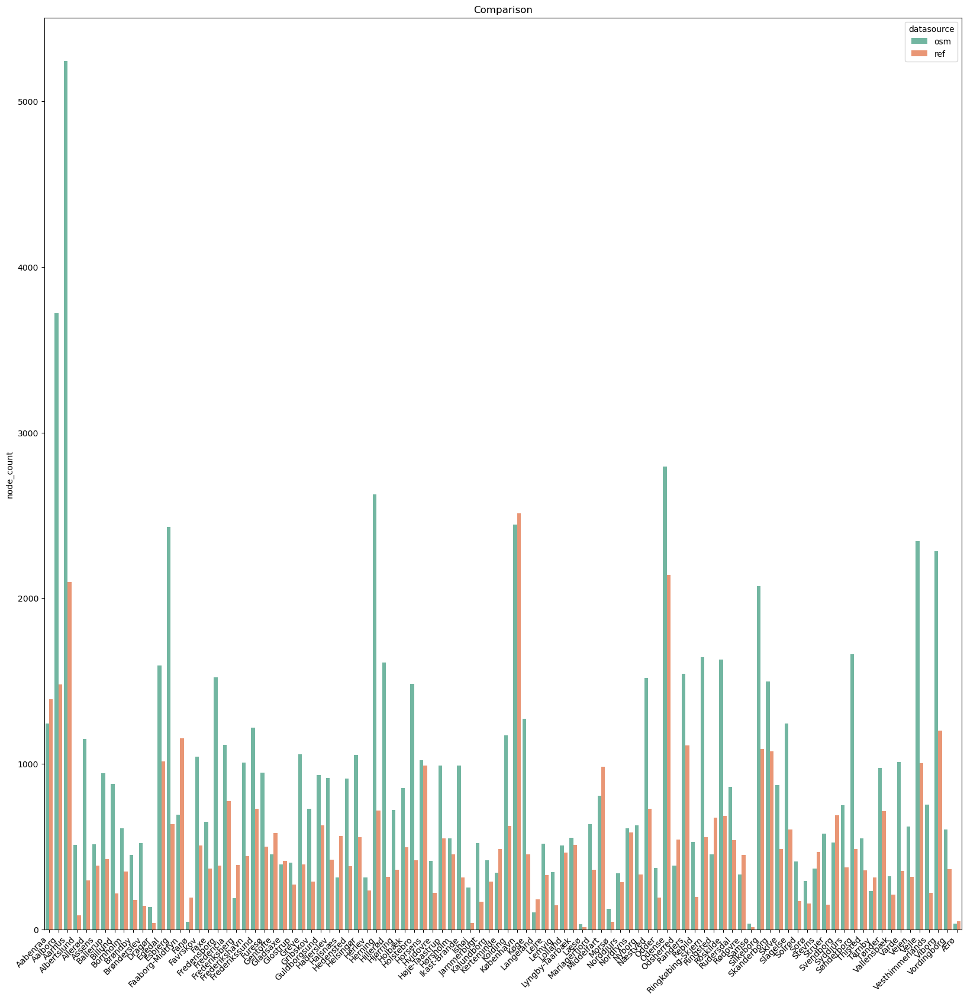

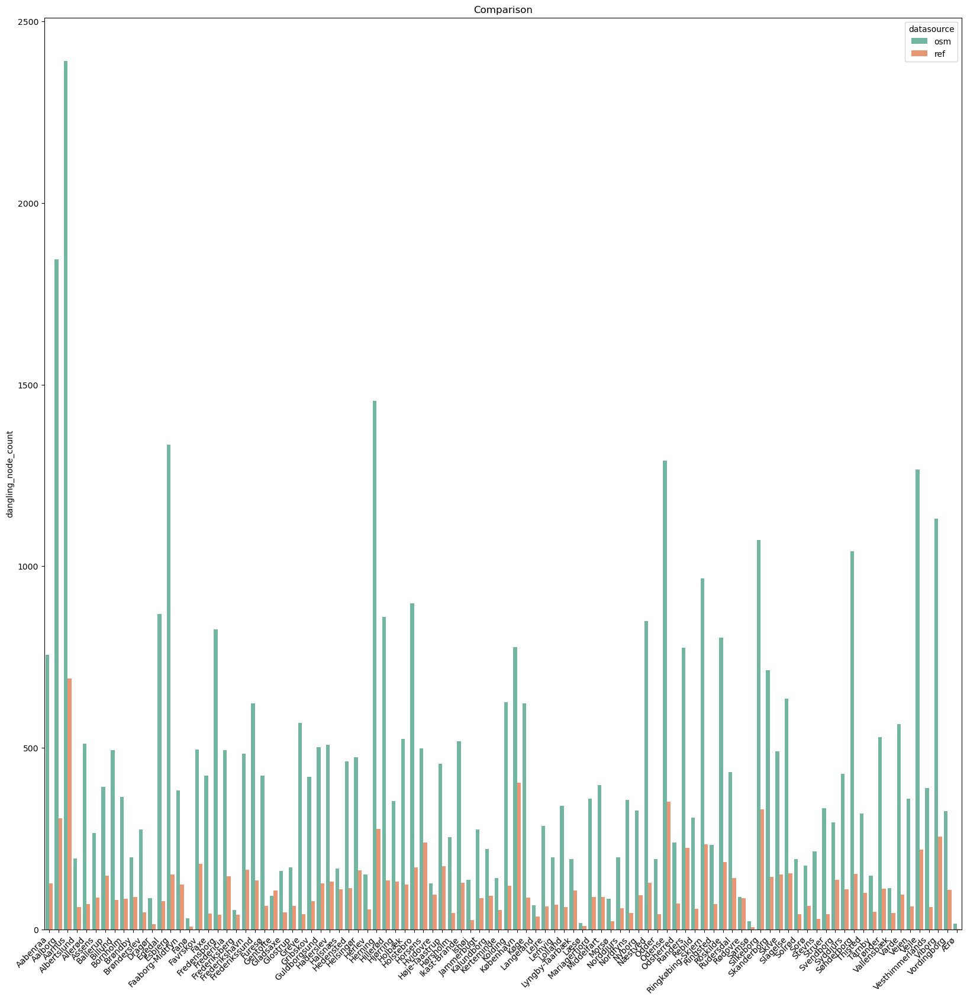

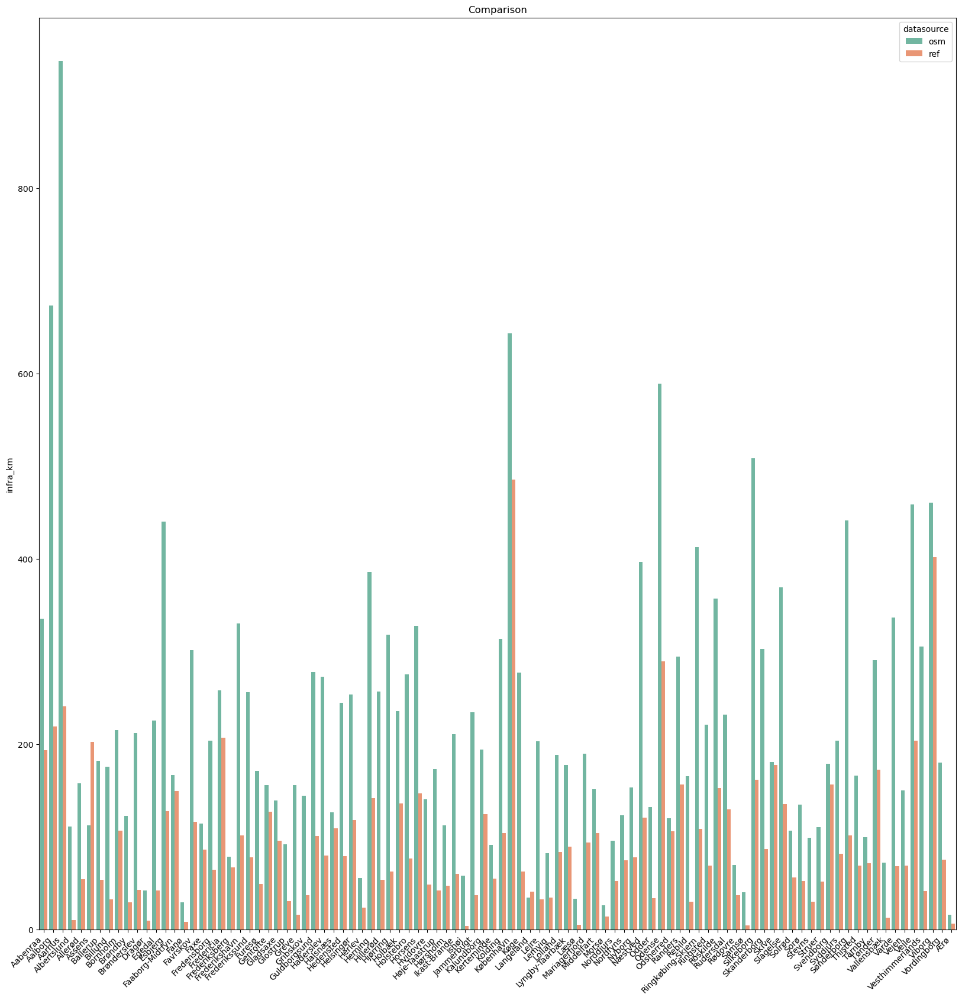

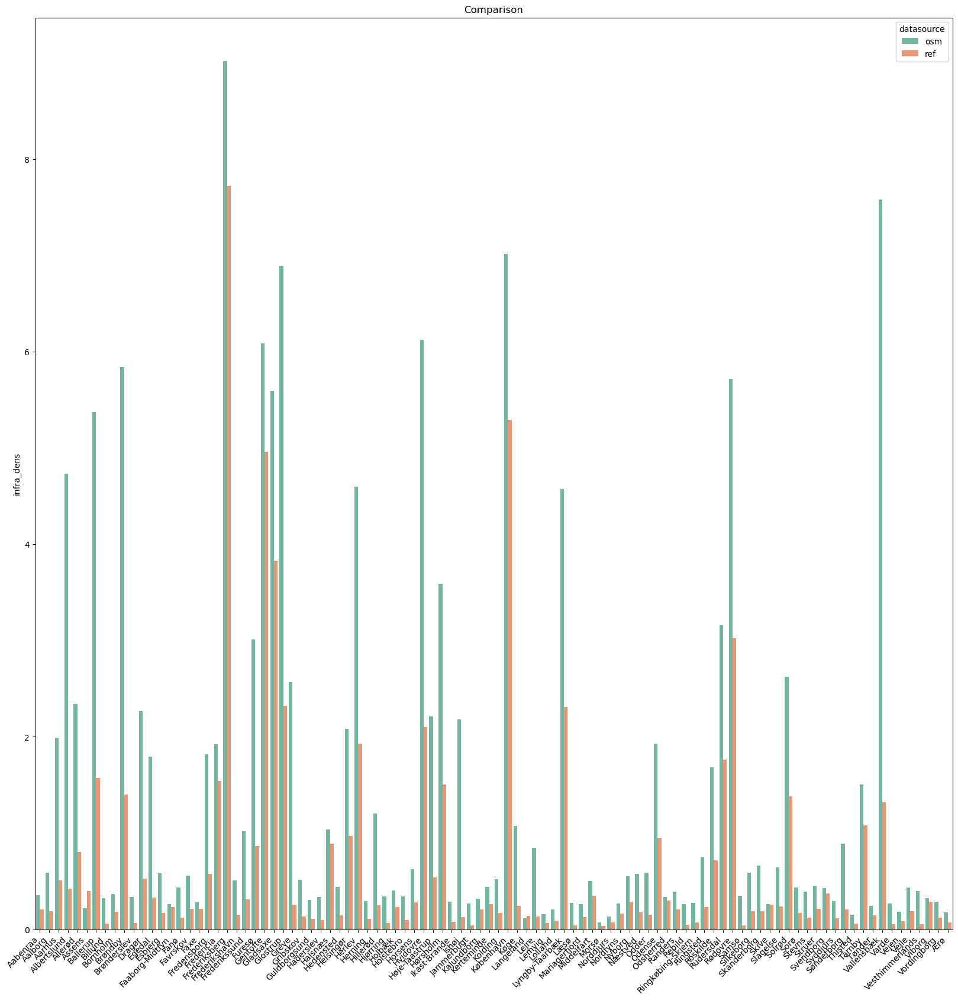

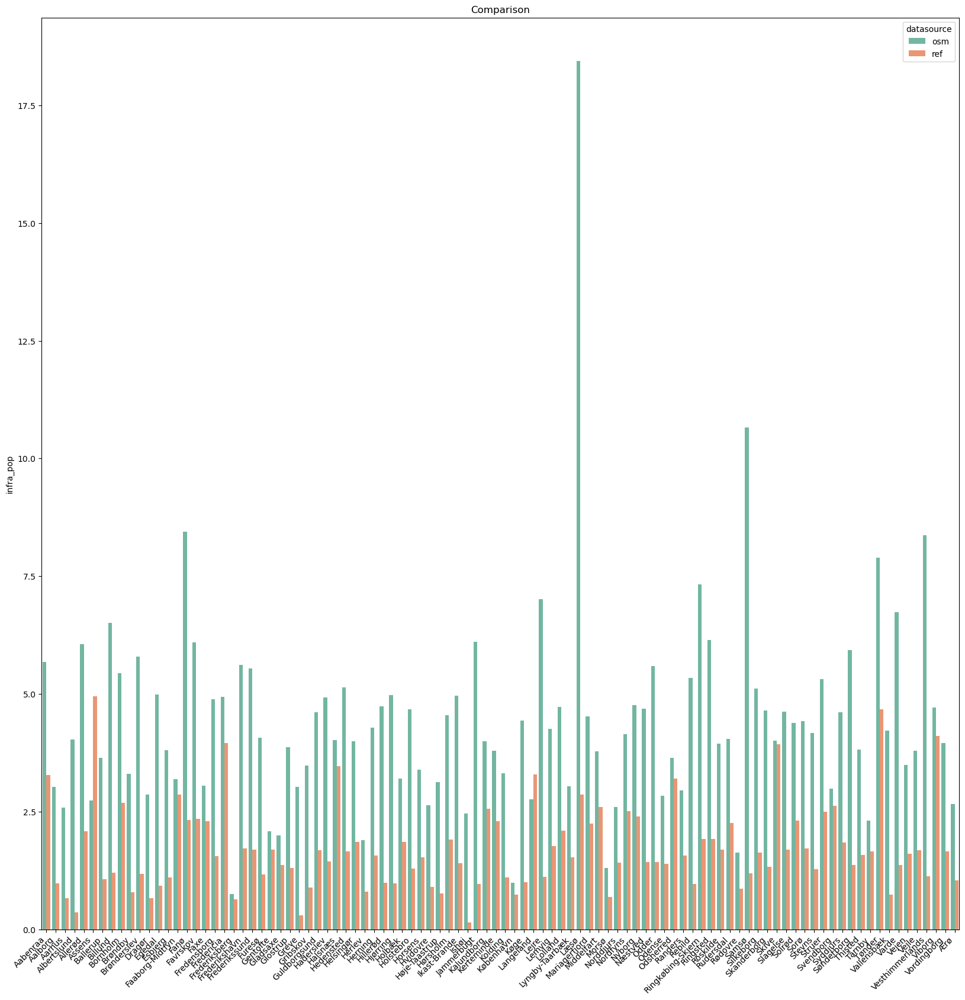

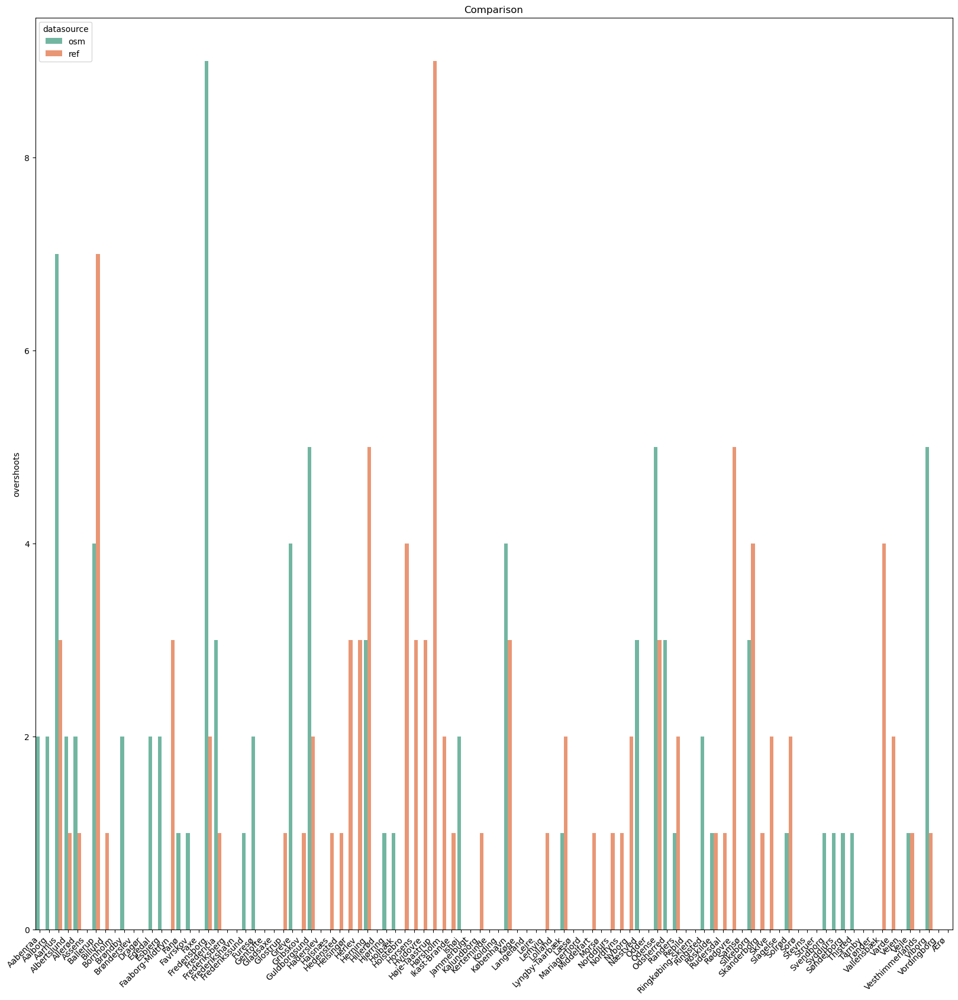

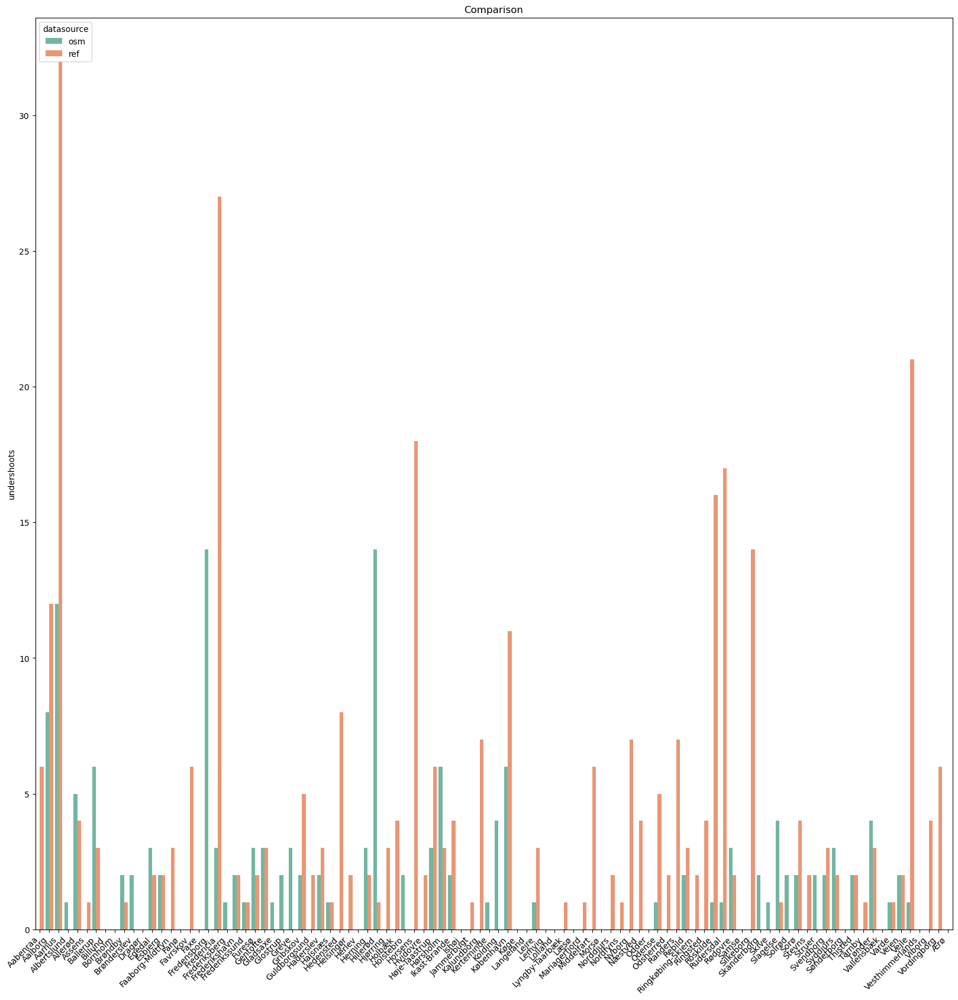

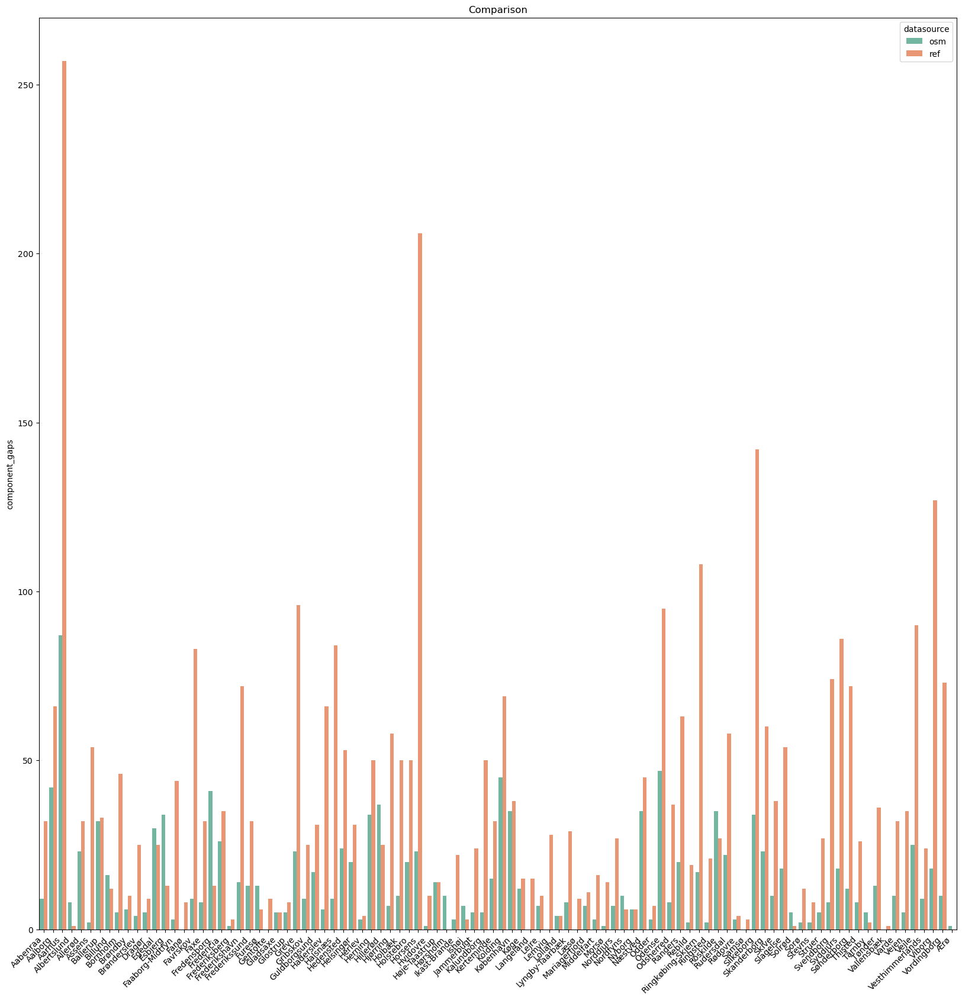

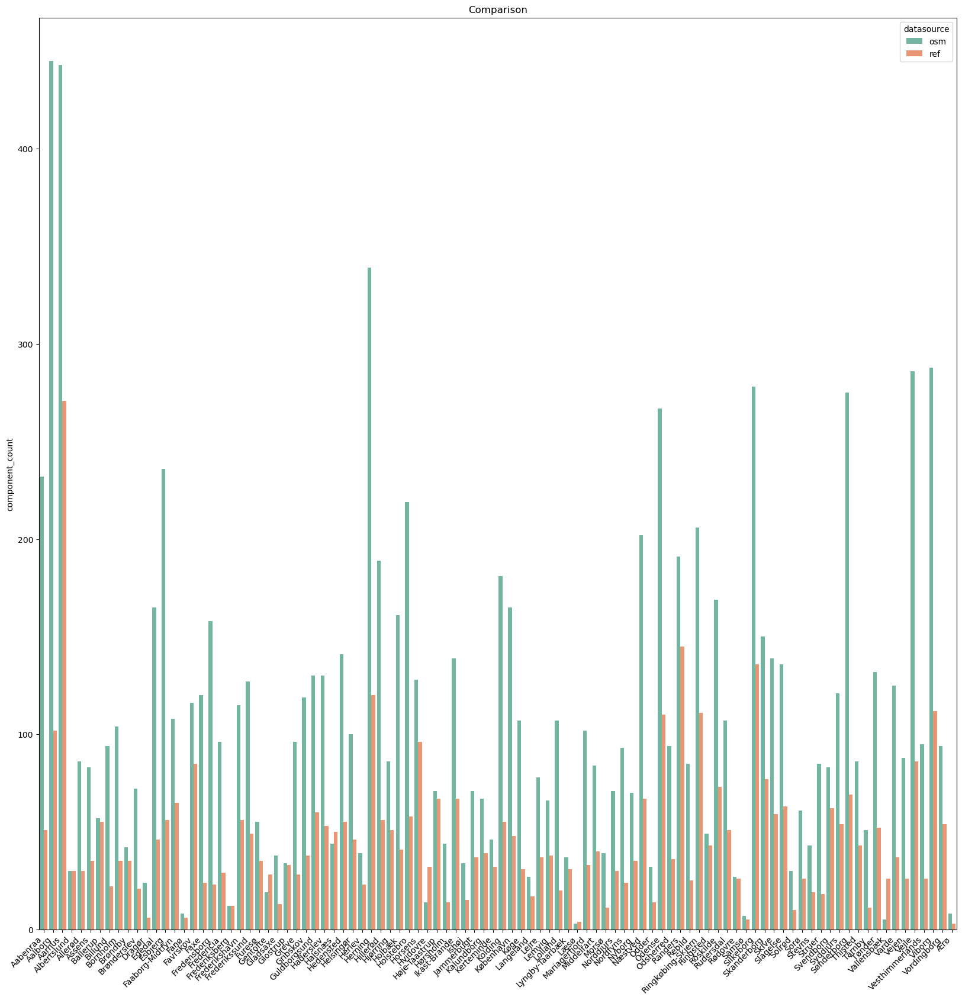

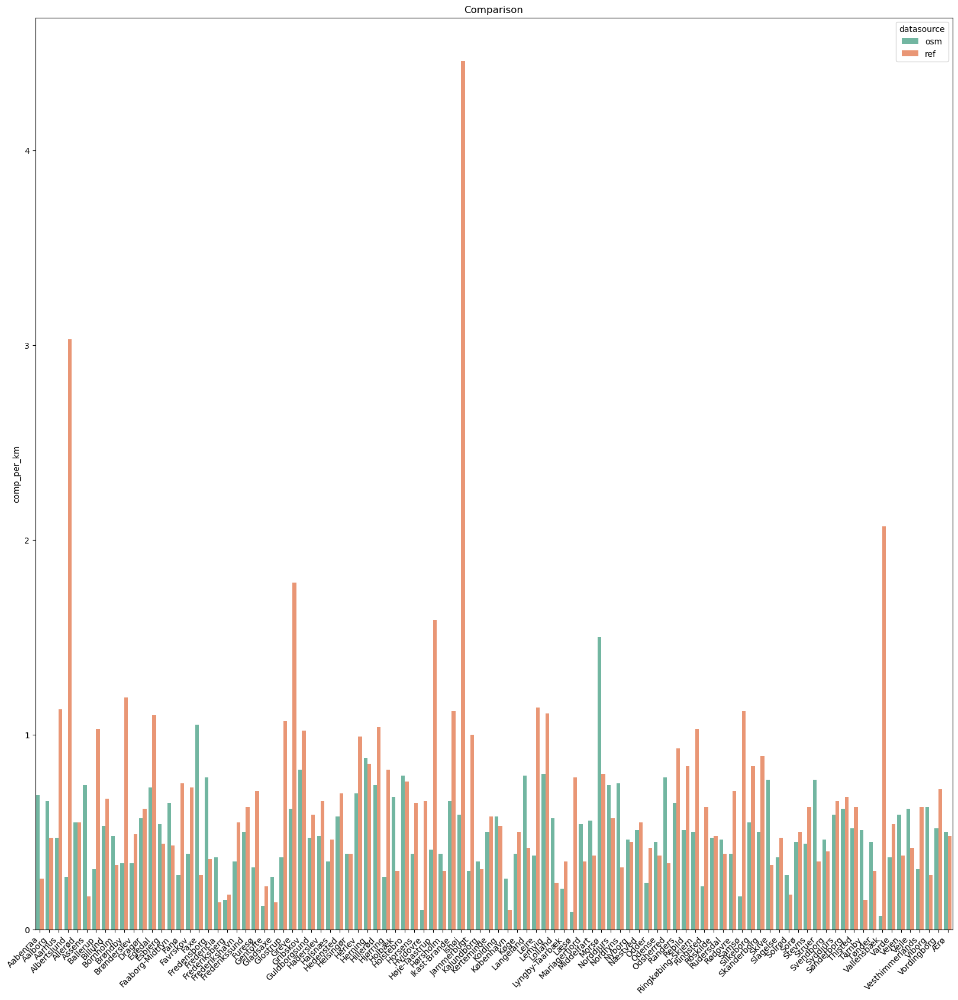

In [14]:
if make_plots:
    for d in diff_cols:

        fig, ax = plt.subplots(figsize=(20,20))

        sns.barplot(combined, x="navn",y=d,ax=ax, hue='datasource',palette='Set2')
        plt.xticks(rotation = 45, ha = 'right')
        plt.xlabel('')
        plt.ylabel(d)
        plt.title('Comparison');

#### Plot total differences

In [15]:
plot_labels = {
    "navn":"",
    "node_count":"nodes",
    "dangling_node_count":"dangling nodes",
    "infra_km": "bicycle infrastructure (km)",
    "infra_pop": "infrastructure per population (km/1000)",
    "component_gaps": "component gaps",
    "component_count": "components",
    "comp_per_km": "components per km",
    "datasource": "data source"
    }

In [16]:
if make_plots:

    for d in diff_cols:

        fig = px.bar(diff_df, y=d, x=diff_df.index, labels=plot_labels)

        fig.update_traces(marker_color='green')

        fig.show()

**Plot percent differences between GeoDK and OSM**

In [17]:
if make_plots:
    for d in pct_diff_cols:

        fig = px.bar(pct_diff_df, y=d, x=diff_df.index, labels=plot_labels)

        fig.update_traces(marker_color='purple')

        fig.show()

#### Plots of value distributions

In [18]:
if make_plots:

    for d in diff_cols:

        fig = px.violin(diff_df, y=d,labels=plot_labels,title='Value distribution: Total differences')

        fig.update_traces(marker_color='green')

        fig.show()

In [19]:
if make_plots:
    
    for d in pct_diff_cols:

        fig = px.violin(pct_diff_df, y=d, labels=plot_labels, title="Value distribution: Percent differences")

        fig.update_traces(marker_color='purple')

        fig.show()

In [20]:
if make_plots:
    
    for d in diff_cols:

        fig = px.violin(combined, x='datasource', y=d, title="Comparison of value distributions",labels=plot_labels)

        fig.update_traces(marker_color='red')

        fig.show()

#### Correlation between differences

**Correlation between total differences**

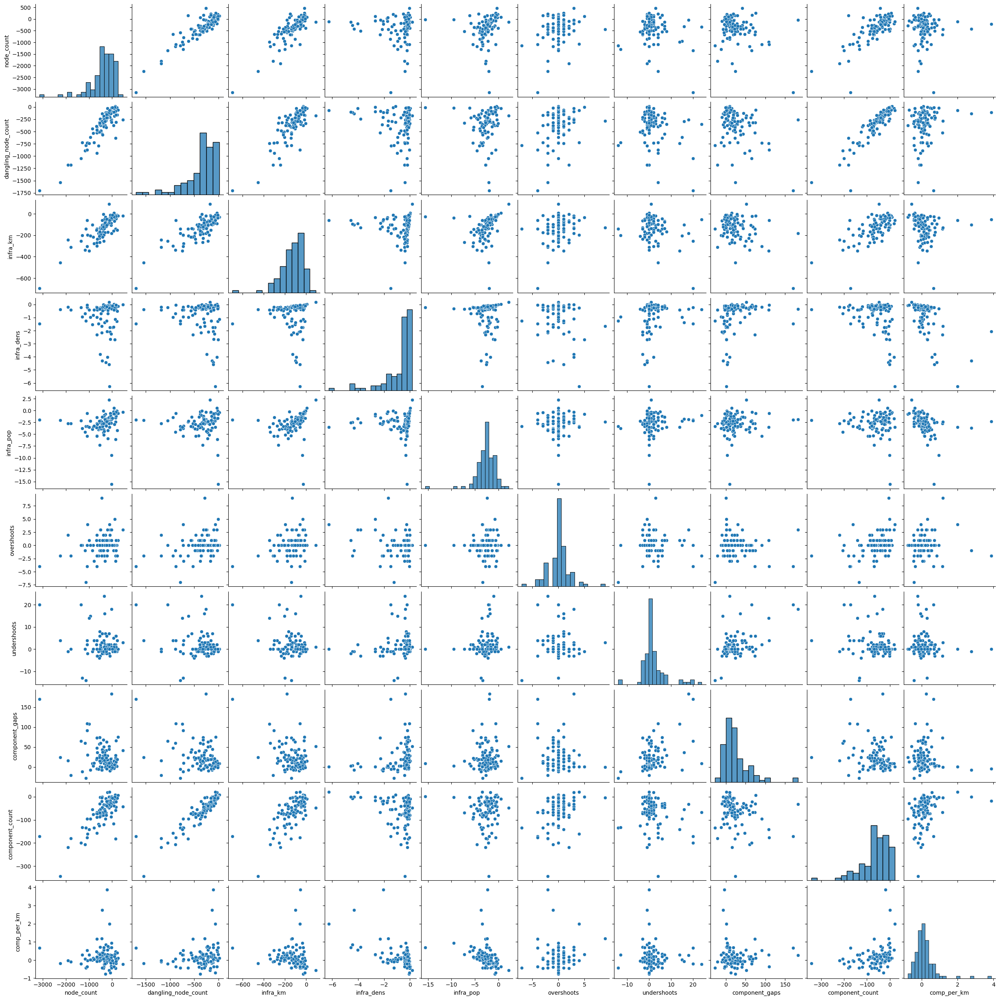

In [21]:
sns.pairplot(diff_df);

**Correlation between standardized differences**

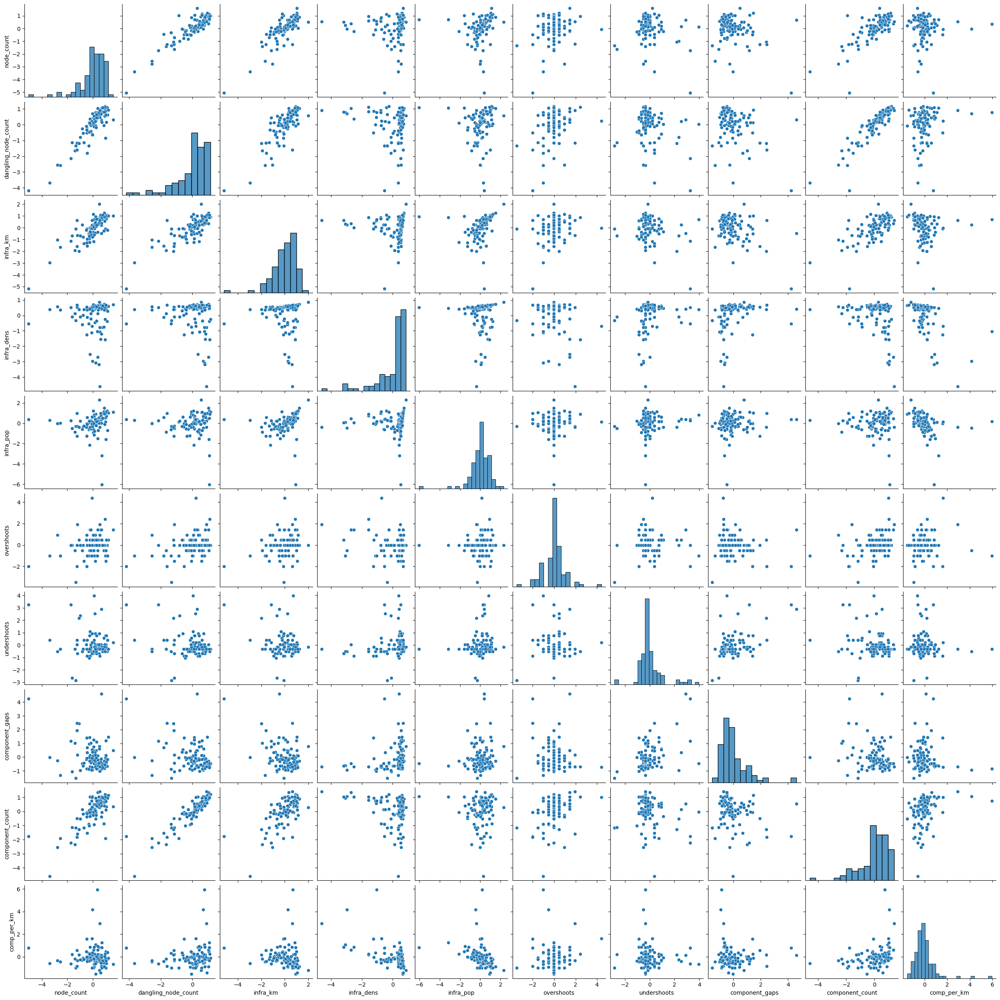

In [22]:
diff_std = pd.DataFrame()

for c in diff_df.columns:
    
    # Z-Score using scipy
    diff_std[c] = stats.zscore(diff_df[c])

sns.pairplot(diff_std);

**Correlation between percent differences**

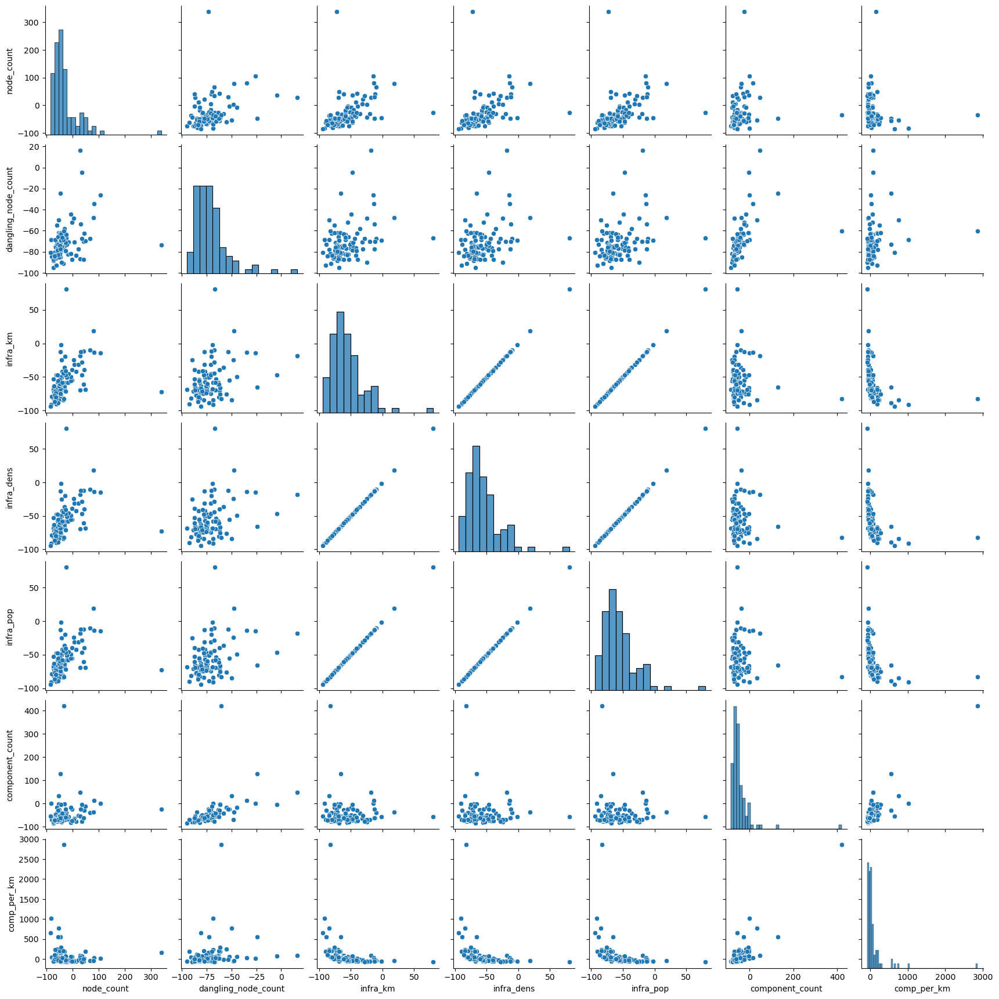

In [23]:
sns.pairplot(pct_diff_df);

**Correlation between standardized percent differences**

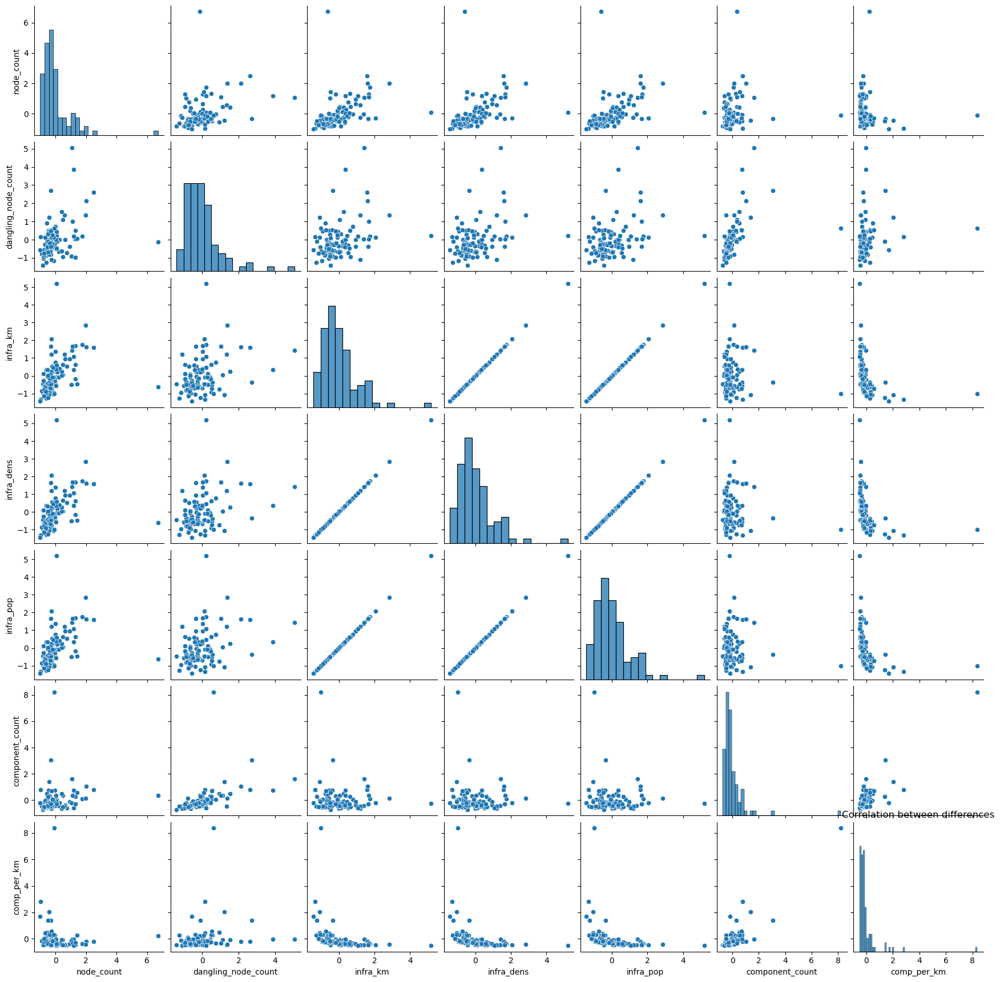

In [24]:
pct_diff_std = pd.DataFrame()

for c in pct_diff_df.columns:
    # Z-Score using scipy
    pct_diff_std[c] = stats.zscore(pct_diff_df[c])

sns.pairplot(pct_diff_std)

plt.title('Correlation between differences');

## Compare ranks

In [25]:
# For infra length, number of components, comps per km

osm_rank = pd.DataFrame()

for d in diff_cols:

    osm_rank[d] = osm_muni[d].rank(ascending=False, method="first")

osm_rank['source'] = 'OSM'

ref_rank = pd.DataFrame()

for d in diff_cols:

    ref_rank[d] = ref_muni[d].rank(ascending=False, method="first")

ref_rank['source'] = reference_name


infra_ranks = pd.concat([osm_rank[['infra_km','source']].reset_index(), ref_rank[['infra_km','source']].reset_index()])

infra_ranks.rename({"infra_km":'rank'},axis=1,inplace=True)

comp_ranks = pd.concat([osm_rank[['component_count','source']].reset_index(), ref_rank[['component_count','source']].reset_index()])

comp_ranks.rename({"component_count":'rank'},axis=1,inplace=True)

comp_km_ranks = pd.concat([osm_rank[['comp_per_km','source']].reset_index(), ref_rank[['comp_per_km','source']].reset_index()])

comp_km_ranks.rename({"comp_per_km":'rank'},axis=1,inplace=True)

In [26]:
osm_rank.compare(ref_rank, keep_equal=True)

node_count       dangling_node_count       infra_km        \
                      self other                self other     self other   
navn                                                                        
Aabenraa              21.0   5.0                19.0  34.0     16.0   9.0   
Aalborg                2.0   4.0                 2.0   5.0      2.0   5.0   
Aarhus                 1.0   3.0                 1.0   1.0      1.0   4.0   
Albertslund           68.0  92.0                75.0  70.0     78.0  92.0   
Allerød               25.0  71.0                30.0  63.0     60.0  63.0   
...                    ...   ...                 ...   ...      ...   ...   
Vejle                  7.0  12.0                 6.0  11.0      7.0   7.0   
Vesthimmerlands       46.0  78.0                49.0  72.0     21.0  75.0   
Viborg                 8.0   6.0                 7.0   7.0      6.0   2.0   
Vordingborg           57.0  59.0                59.0  42.0     51.0  49.0   
Ærø                   97.0  93.0                98.0  98.0     98.0  95.0   

                infra_dens       infra_pop        ... undershoots        \
                      self other      self other  ...        self other   
navn                                              ...                     
Aabenraa              64.0  51.0      16.0   8.0  ...        51.0  14.0   
Aalborg               41.0  54.0      79.0  79.0  ...         4.0   8.0   
Aarhus                24.0  27.0      89.0  93.0  ...         3.0   1.0   
Albertslund           11.0  28.0      53.0  96.0  ...        38.0  66.0   
Allerød               19.0  22.0      13.0  27.0  ...         8.0  21.0   
...                    ...   ...       ...   ...  ...         ...   ...   
Vejle                 57.0  55.0      64.0  41.0  ...        50.0   3.0   
Vesthimmerlands       60.0  93.0       4.0  71.0  ...        95.0  97.0   
Viborg                72.0  35.0      34.0   3.0  ...        96.0  27.0   
Vordingborg           77.0  75.0      58.0  43.0  ...        97.0  18.0   
Ærø                   93.0  86.0      86.0  76.0  ...        98.0  98.0   

                component_gaps       component_count       comp_per_km        \
                          self other            self other        self other   
navn                                                                           
Aabenraa                  46.0  40.0            10.0  34.0        18.0  89.0   
Aalborg                    4.0  17.0             1.0   8.0        20.0  60.0   
Aarhus                     1.0   1.0             2.0   1.0        53.0   8.0   
Albertslund               51.0  94.0            86.0  64.0        86.0   2.0   
Allerød                   18.0  41.0            53.0  65.0        36.0  50.0   
...                        ...   ...             ...   ...         ...   ...   
Vejle                     16.0   8.0             5.0  10.0        27.0  68.0   
Vesthimmerlands           50.0  59.0            47.0  74.0        82.0  45.0   
Viborg                    28.0   4.0             4.0   5.0        24.0  88.0   
Vordingborg               45.0  13.0            50.0  31.0        42.0  31.0   
Ærø                       91.0  98.0            95.0  98.0        50.0  59.0   

                source              
                  self       other  
navn                                
Aabenraa           OSM  GeoDanmark  
Aalborg            OSM  GeoDanmark  
Aarhus             OSM  GeoDanmark  
Albertslund        OSM  GeoDanmark  
Allerød            OSM  GeoDanmark  
...                ...         ...  
Vejle              OSM  GeoDanmark  
Vesthimmerlands    OSM  GeoDanmark  
Viborg             OSM  GeoDanmark  
Vordingborg        OSM  GeoDanmark  
Ærø                OSM  GeoDanmark  

[98 rows x 22 columns]

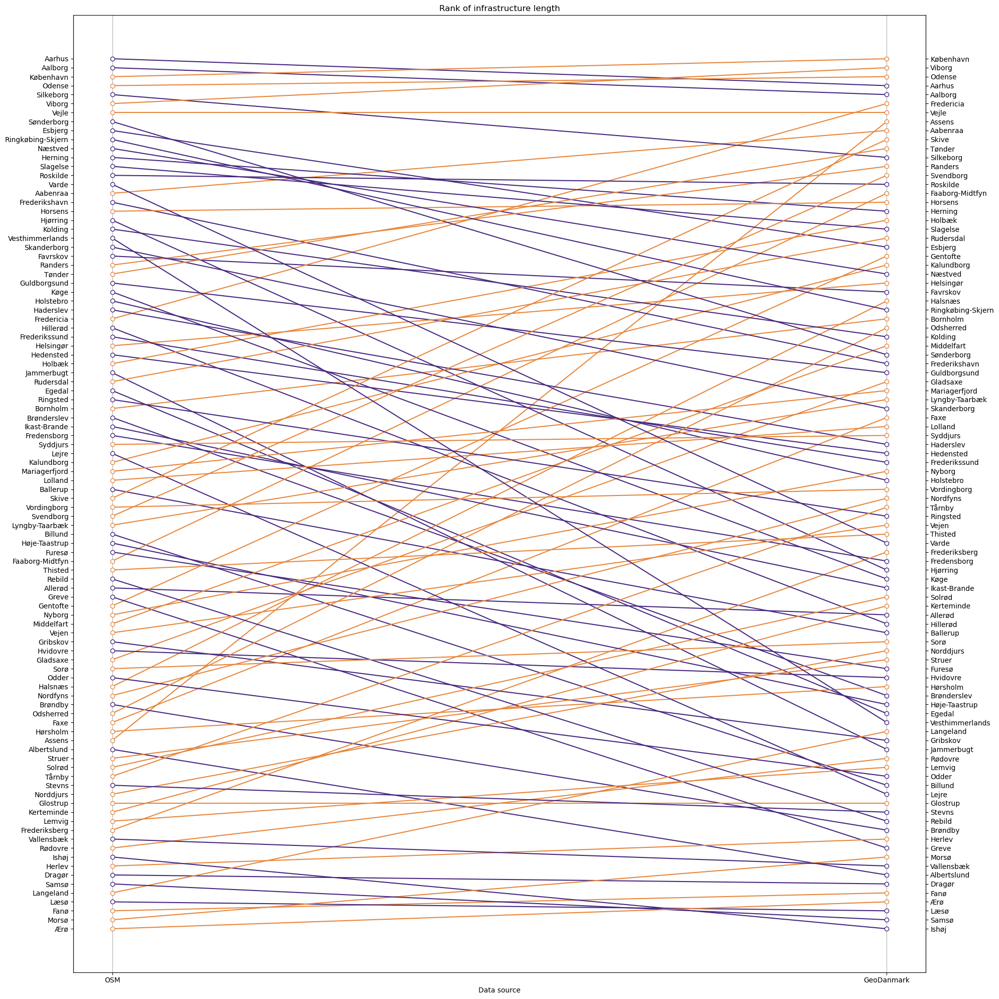

In [27]:
from matplotlib.ticker import MultipleLocator, FixedFormatter, FixedLocator

# based on https://stackoverflow.com/questions/68095438/how-to-make-a-bump-chart

fig, ax = plt.subplots(figsize=(20,20))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

ax.get_yaxis().set_visible(False)
yax1 = ax.secondary_yaxis("left")
yax1.yaxis.set_major_locator(FixedLocator(infra_ranks["rank"].to_list()[0:98]))
yax1.yaxis.set_major_formatter(FixedFormatter(infra_ranks["navn"].to_list()[0:98]))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(infra_ranks["rank"].to_list()[98:]))
yax2.yaxis.set_major_formatter(FixedFormatter(infra_ranks["navn"].to_list()[98:]))

for i, g in infra_ranks.groupby("navn"):
    if g["rank"].loc[g["source"]=='OSM'].values[0] < g["rank"].loc[g["source"]=='GeoDanmark'].values[0]:
        c = "#45277F" #"#be001a" #'red'
    else:
        c = "#E7853A" #"#2c8aee" #'blue'
    ax.plot("source", "rank", "o-", data=g, mfc="w",color=c)

ax.invert_yaxis()
ax.set(xlabel="Data source", ylabel="Rank", title="Rank of infrastructure length")
ax.grid(axis="x")
plt.tight_layout()

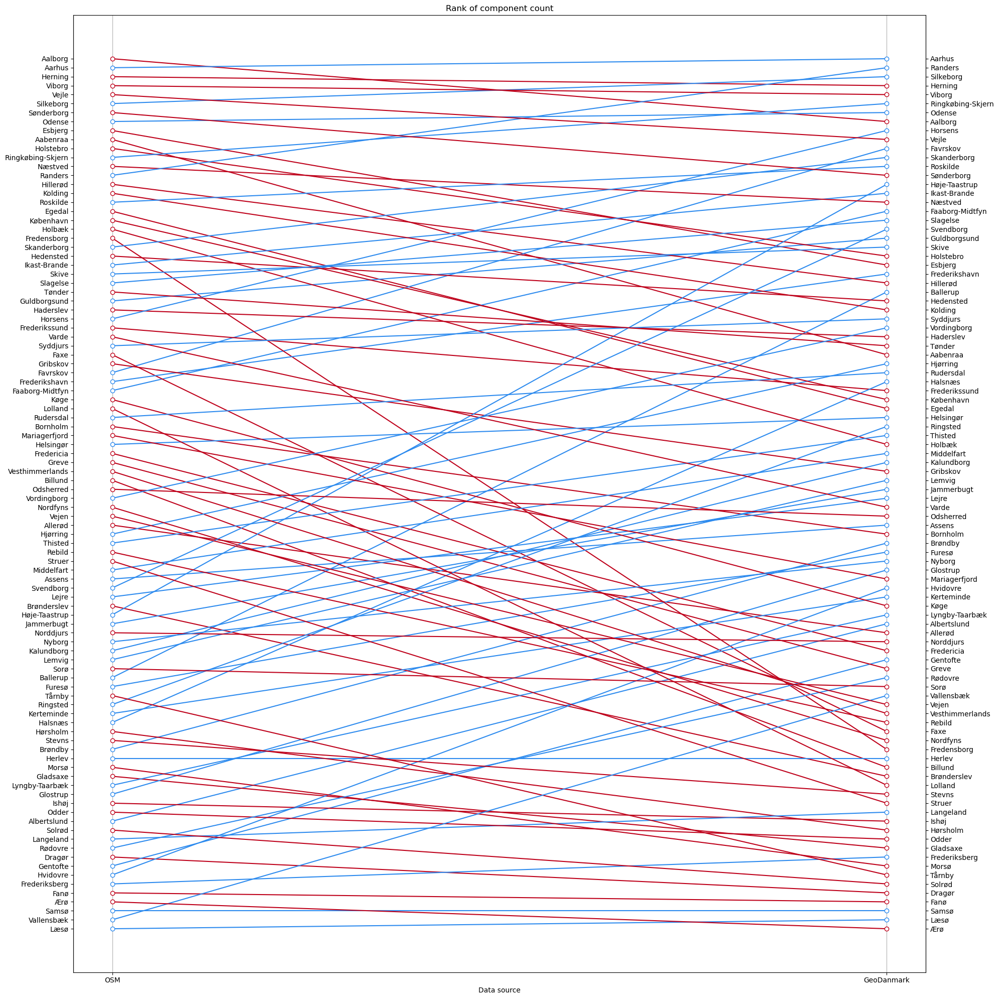

In [28]:
from matplotlib.ticker import MultipleLocator, FixedFormatter, FixedLocator

# based on https://stackoverflow.com/questions/68095438/how-to-make-a-bump-chart

fig, ax = plt.subplots(figsize=(20, 20))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

ax.get_yaxis().set_visible(False)
yax1 = ax.secondary_yaxis("left")
yax1.yaxis.set_major_locator(FixedLocator(comp_ranks["rank"].to_list()[0:98]))
yax1.yaxis.set_major_formatter(FixedFormatter(comp_ranks["navn"].to_list()[0:98]))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(comp_ranks["rank"].to_list()[98:]))
yax2.yaxis.set_major_formatter(FixedFormatter(comp_ranks["navn"].to_list()[98:]))

for i, g in comp_ranks.groupby("navn"):
    if g["rank"].loc[g["source"]=='OSM'].values[0] < g["rank"].loc[g["source"]=='GeoDanmark'].values[0]:
        c = "#be001a" #'red'
    else:
        c = "#2c8aee" #'blue'
    ax.plot("source", "rank", "o-", data=g, mfc="w",color=c)

ax.invert_yaxis()
ax.set(xlabel="Data source", ylabel="Rank", title="Rank of component count")
ax.grid(axis="x")
plt.tight_layout()


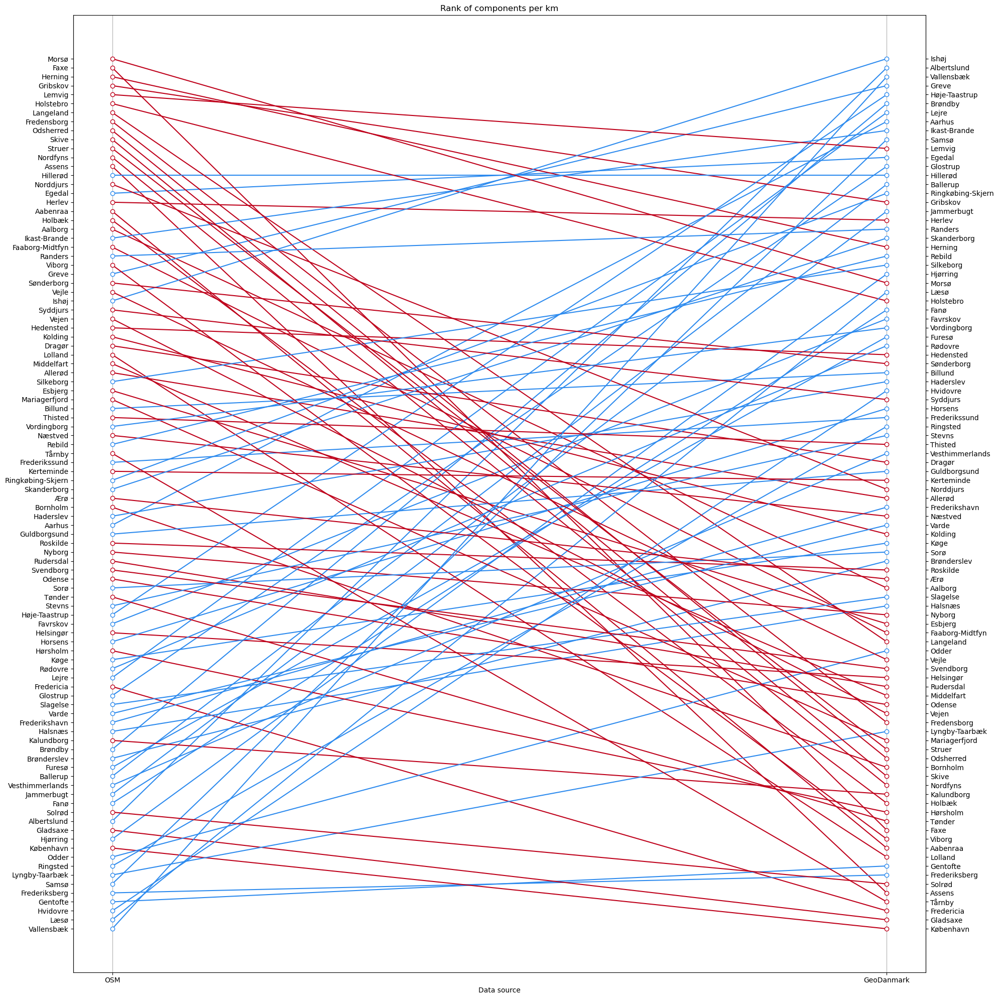

In [29]:
from matplotlib.ticker import MultipleLocator, FixedFormatter, FixedLocator

# based on https://stackoverflow.com/questions/68095438/how-to-make-a-bump-chart

fig, ax = plt.subplots(figsize=(20,20))

ax.xaxis.set_major_locator(MultipleLocator(1))
ax.yaxis.set_major_locator(MultipleLocator(1))

ax.get_yaxis().set_visible(False)
yax1 = ax.secondary_yaxis("left")
yax1.yaxis.set_major_locator(FixedLocator(comp_km_ranks["rank"].to_list()[0:98]))
yax1.yaxis.set_major_formatter(FixedFormatter(comp_km_ranks["navn"].to_list()[0:98]))

yax2 = ax.secondary_yaxis("right")
yax2.yaxis.set_major_locator(FixedLocator(comp_km_ranks["rank"].to_list()[98:]))
yax2.yaxis.set_major_formatter(FixedFormatter(comp_km_ranks["navn"].to_list()[98:]))

for i, g in comp_km_ranks.groupby("navn"):
    if g["rank"].loc[g["source"]=='OSM'].values[0] < g["rank"].loc[g["source"]=='GeoDanmark'].values[0]:
        c = "#be001a" #'red'
    else:
        c = "#2c8aee" #'blue'
    ax.plot("source", "rank", "o-", data=g, mfc="w",color=c)

ax.invert_yaxis()
ax.set(xlabel="Data source", ylabel="Rank", title="Rank of components per km")
ax.grid(axis="x")
plt.tight_layout()